# Employment ratios

Prepared by [**Erico Farias da Silva**](erico_fariass@hotmail.com)

## Tables needed
- lfst_r_lfsd2pwn
- tepsr_lm220 -> employment gap

## Directory

In [1]:
# We save the direc
_THISDIR_ = !pwd
print('Current working directory: %s' % _THISDIR_)

Current working directory: ['/home/erico/git_workspace/istat_2020']


### Settings

Put all libraries/packages/modules/etc... that are necessary so that you can run this notebook.

In [2]:
from datetime import datetime
print("Last update/running of this notebook: \033[1m%s\033[0m" % datetime.today())

Last update/running of this notebook: 2020-09-23 21:42:28.936507


In [3]:
try:
#  import google.colab
    !pip install eurostatapiclient
except:
    pass

In [4]:
import requests
import io, os, re, sys
import warnings
import copy, functools
import zipfile

In [5]:
import json

import pandas as pd
pd.set_option('mode.chained_assignment', None) # ignore SettingWithCopyWarning
import numpy as np

#### Geopandas

In [6]:
try:
    import geopandas as gpd
except ImportError:
    try:
        !{sys.executable} -m pip install geopandas
    except:
        print("! Package geopandas not installed !")
    else:
        print("! Package geopandas installed on-the-fly !")
        import geopandas as gpd
finally:
    warnings.filterwarnings('ignore', 'GeoSeries.notna', UserWarning)

try:
    from shapely import geometry
except ImportError:
    try:
        !{sys.executable} -m pip install shapely
    except:
        print("! Package geopandas not installed !")
    else:
        print("! Package geopandas installed on-the-fly !")
        from shapely import geometry

        
!pip install descartes

#### Matplotlib

In [7]:
try:
    import matplotlib
except ImportError:
    raise IOError("Guess what: you're doomed...")
else:
    import matplotlib.pyplot as mplt
    import matplotlib.dates as mdates
    import matplotlib.patches as mpatches
    import matplotlib as mpl
    from matplotlib.ticker import FuncFormatter, MaxNLocator, IndexLocator
finally:
    _FIGSIZE_, _DPI_ = (35,20), 300 # just some default display size/resolution inside this notebook...
%matplotlib inline

In [8]:
try:
    import folium
except ImportError:
    try:
        !{sys.executable} -m pip install folium
    except:
        print("! Package folium not installed !")
    else:
        print("! Package folium installed on-the-fly !")
        import folium
finally:
    from folium import plugins as foliump

try:
    import branca
except ImportError:
    try:
        !{sys.executable} -m pip install branca
    except:
        print("! Package branca not installed !")
    else:
        print("! Package branca installed on-the-fly !")
finally:
    import branca.colormap as bcm

#### eurostatapiclient

In [9]:
from eurostatapiclient import EurostatAPIClient
#import numpy as np
#import pandas as pd
import seaborn as sns
#import matplotlib.pyplot as plt
#import matplotlib.ticker as ticker
#import matplotlib.patches as mpatches
#from sklearn.linear_model import LinearRegression

legend_properties = {'weight':'bold','size':'12'}
countries_names = {'AT':'Austria', 'BE':'Belgium', 'BG':'Bulgaria', 'CY': 'Cyprus', 'CZ': 'Czechia', 'DE': 'Germany',
                   'DK': 'Denmark', 'EE':'Estonia', 'EL': 'Greece', 'ES':'Spain', 'FI':'Finland', 'FR': 'France',
                   'HR':'Croatia', 'HU':'Hungary', 'IE':'Ireland', 'IT':'Italy', 'LT':'Lithuania', 'LU':'Luxembourg',
                   'LV':'Latvia', 'MT': 'Malta', 'NL':'Netherlands', 'PL':'Poland', 'PT':'Portugal', 'RO':'Romania',
                   'SE':'Sweden', 'SI':'Slovenia', 'SK':'Slovakia', 'EU27_2020': 'EU-27', 'UK':'United Kingdom', 'IS':
                   'Iceland', 'CH': 'Switzerland', 'MK': 'North Macedonia', 'TR': 'Turkey'}
countries_abbr = ['AT','BE','BG','CY','CZ','DE','DK','EE','EL','ES','FI', 'FR','HR','HU','IE','IT','LT','LU','LV',
                  'MT', 'NL', 'PL', 'PT', 'RO', 'SE', 'SI', 'SK', 'EU27_2020', 'UK', 'IS', 'CH', 'MK', 'TR']
member_states = ['AT','BE','BG','CY','CZ','DE','DK','EE','EL','ES','FI', 'FR','HR','HU','IE','IT','LT','LU','LV',
                 'MT', 'NL', 'PL', 'PT', 'RO', 'SE', 'SI', 'SK']

## Data ingestion

Dirty way

In [10]:
BULK_DOMAIN = 'https://ec.europa.eu/eurostat/estat-navtree-portlet-prod/BulkDownloadListing?sort=1'
LABOR_FILE = 'lfst_r_lfsd2pwn'
LABOR_FMT = 'tsv' # or xml...

labor_url = '{}&file=data%2F{}.{}.gz'.format(BULK_DOMAIN, LABOR_FILE, LABOR_FMT)

print("URL for labor data: \033[1m%s\033[0m" % labor_url)

URL for labor data: https://ec.europa.eu/eurostat/estat-navtree-portlet-prod/BulkDownloadListing?sort=1&file=data%2Flfst_r_lfsd2pwn.tsv.gz


Via EurostatAPIClient

In [11]:
# Set version, format and language
VERSION = 'v2.1'
FORMAT = 'json'
LANGUAGE = 'en'
# call client
client = EurostatAPIClient(VERSION, FORMAT, LANGUAGE)

In [12]:
# Set colors
c_tot = '#f4c95d'
c_mal = '#f36744'
c_fem = '#134f67'

# style
mplt.style.use('fivethirtyeight')

In [13]:
# Set parameters # AGE == 20~64
YEARS = ['2010','2013','2016','2019']

params = {
    'citizen': [
        #'EU27_2020_FOR','NEU27_2020_FOR',
        'TOTAL'],
#    'geoLevel':[
#        'nuts2','nuts1'],
    'time':YEARS,
    'wstatus':[
        'POP','ACT','EMP','INAC','UNE'],
    'precision':'2',
    'age':'Y20-64'
}


#POP:Population
#ACT:Active persons
#EMP:Employed persons
#UNE:Unemployed persons
#INAC:Inactive persons
#UNK:Unknown

dic = {'time' : 'year'}

# GET the data
dataset = client.get_dataset('lfst_r_lfsd2pwn', params=params)
#print(dataset.label)

dataset2 = client.get_dataset('tepsr_lm220', params={'time':YEARS}) #Gender employment gap by NUTS 2 regions (%), Y20-64
#print(dataset.label)

# Transform into a dataframe
df = dataset.to_dataframe()
df.rename(columns=dic, inplace=True)
df['year'] = df['year']
print(df.head(10))

df2 = dataset2.to_dataframe()
df2.rename(columns=dic, inplace=True)
df2['year'] = df2['year']
print(df2.head())

   values unit wstatus citizen sex     age   geo  year
0  1842.8  THS     ACT   TOTAL   F  Y20-64    AT  2010
1  1921.5  THS     ACT   TOTAL   F  Y20-64    AT  2013
2  1999.4  THS     ACT   TOTAL   F  Y20-64    AT  2016
3  2043.6  THS     ACT   TOTAL   F  Y20-64    AT  2019
4   793.0  THS     ACT   TOTAL   F  Y20-64   AT1  2010
5   833.0  THS     ACT   TOTAL   F  Y20-64   AT1  2013
6   868.6  THS     ACT   TOTAL   F  Y20-64   AT1  2016
7   888.0  THS     ACT   TOTAL   F  Y20-64   AT1  2019
8    61.2  THS     ACT   TOTAL   F  Y20-64  AT11  2010
9    62.7  THS     ACT   TOTAL   F  Y20-64  AT11  2013
   values unit   geo  year
0    12.2   PC  AT11  2010
1     9.6   PC  AT11  2013
2     8.2   PC  AT11  2016
3    10.2   PC  AT11  2019
4     9.9   PC  AT12  2010


In [14]:
df = df.dropna().reset_index()

keep = ['values', 'geo', 'sex', 'wstatus', 'year']
df = df[keep]

pivoted = df.pivot_table(index=['geo', 'sex'], columns=['year','wstatus'], values='values')
pivoted = pivoted.swaplevel(axis='columns')
pivoted = pivoted.divide(pivoted['POP'], axis=0)
pivoted = pivoted.swaplevel(axis='columns')
pivoted = pivoted.stack(level=1)

In [63]:
#pivoted = pivoted.dropna()

#pivoted.index.get_level_values(0)

pivo = pivoted.reset_index()
pivo.head(20)

pivo.rename(columns = {'geo':'NUTS_ID'}, inplace = True)

'EU27_2020'

#eu27 = pivo[pivo['NUTS_ID']=='EU27_2020']

#total = pivo[(pivo['sex']=='T')]
#females = pivo[(pivo['sex']=='F')]
#males = pivo[(pivo['sex']=='M')]

Retrieve the regions

In [16]:
REGIONS = pivo['NUTS_ID'].unique().tolist()

print("NUTS regions available: \033[1m%s\033[0m" % REGIONS)

NUTS regions available: ['AT', 'AT1', 'AT11', 'AT12', 'AT13', 'AT2', 'AT21', 'AT22', 'AT3', 'AT31', 'AT32', 'AT33', 'AT34', 'BE', 'BE1', 'BE10', 'BE2', 'BE21', 'BE22', 'BE23', 'BE24', 'BE25', 'BE3', 'BE31', 'BE32', 'BE33', 'BE34', 'BE35', 'BG', 'BG3', 'BG31', 'BG32', 'BG33', 'BG34', 'BG4', 'BG41', 'BG42', 'CH', 'CH0', 'CH01', 'CH02', 'CH03', 'CH04', 'CH05', 'CH06', 'CH07', 'CY', 'CY0', 'CY00', 'CZ', 'CZ0', 'CZ01', 'CZ02', 'CZ03', 'CZ04', 'CZ05', 'CZ06', 'CZ07', 'CZ08', 'DE', 'DE1', 'DE11', 'DE12', 'DE13', 'DE14', 'DE2', 'DE21', 'DE22', 'DE23', 'DE24', 'DE25', 'DE26', 'DE27', 'DE3', 'DE30', 'DE4', 'DE40', 'DE5', 'DE50', 'DE6', 'DE60', 'DE7', 'DE71', 'DE72', 'DE73', 'DE8', 'DE80', 'DE9', 'DE91', 'DE92', 'DE93', 'DE94', 'DEA', 'DEA1', 'DEA2', 'DEA3', 'DEA4', 'DEA5', 'DEB', 'DEB1', 'DEB2', 'DEB3', 'DEC', 'DEC0', 'DED', 'DED2', 'DED4', 'DED5', 'DEE', 'DEE0', 'DEF', 'DEF0', 'DEG', 'DEG0', 'DK', 'DK0', 'DK01', 'DK02', 'DK03', 'DK04', 'DK05', 'EA19', 'EE', 'EE0', 'EE00', 'EL', 'EL3', 'EL30', '

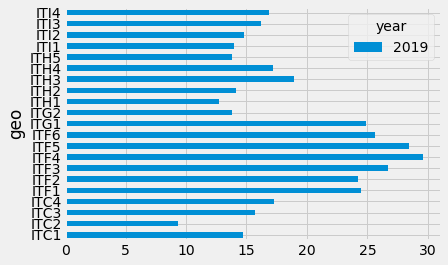

In [17]:
# Working on employment gap

pivoted2 = df2.pivot_table(index='geo', columns='year', values='values')
pivoted2.reset_index(inplace=True)

italy_gap = pivoted2[pivoted2['geo'].str.startswith('IT')][['geo','2019']]

#pivoted2[pivoted2['geo'].str.startswith(('IT','DE'))]


italy_gap.plot('geo', kind='barh')

## Map

We first select the projection that will be used in this exercise. For visualisation purpose, we select the common lat/lon coordinate system (WGS84, or EPSG:4326) as the reference system:

In [18]:
PROJ = 'EPSG:4326'

In [19]:
GISCO_DOMAIN = 'https://gisco-services.ec.europa.eu/distribution/v2/'
NUTS_DOMAIN = 'nuts'

NUTS_YEAR = 2016
NUTS_RES = 20 # 60
NUTS_PROJ = PROJ.split(':')[-1] 
NUTS_FMT = 'geojson' # 'topojson'

nuts_template = 'NUTS_RG_%sM_%s_%s_LEVL_%%s.%s' % (NUTS_RES, NUTS_YEAR, NUTS_PROJ, NUTS_FMT) 
nuts_url = '%s/%s/%s' %  (GISCO_DOMAIN, NUTS_DOMAIN, NUTS_FMT)

#https://gisco-services.ec.europa.eu/distribution/v2/nuts/geojson/NUTS_RG_20M_2021_3857_LEVL_1.geojson
#    'NUTS_RG_%sM_%s_3035_LEVL_%s.%s'

print("Generic URL for NUTS data: \033[1m%s/%s\033[0m (where '%%s' represents a level)" 
      % (nuts_url, nuts_template))

Generic URL for NUTS data: https://gisco-services.ec.europa.eu/distribution/v2//nuts/geojson/NUTS_RG_20M_2016_4326_LEVL_%s.geojson (where '%s' represents a level)


In [20]:
LEVELS = [0,1,2
          #,3
         ]

nuts_files = dict.fromkeys(LEVELS)
nuts_ext = NUTS_FMT

for level in LEVELS:
    nuts_file = nuts_template % level
    nuts_source = '%s/%s' % (nuts_url,nuts_file)
    try : 
        dest = os.path.join(_THISDIR_[0], nuts_file)
        assert os.path.exists(dest)
    except:
        try:
            !wget -O $dest "$nuts_source"
            #!mkdir $nuts_dir
            #!unzip -u -d $nuts_dir $nuts_source        
        except:
            raise IOError("Error fetching the data...")
        else:
            print('Data loaded on disk in directory: \033[1m%s\033[0m' % dest)
    else:
        print('Data already loaded on disk in directory: \033[1m%s\033[0m' % dest)
    finally:
        nuts_files.update({level: nuts_file}) # dest

Data already loaded on disk in directory: /home/erico/git_workspace/istat_2020/NUTS_RG_20M_2016_4326_LEVL_0.geojson
Data already loaded on disk in directory: /home/erico/git_workspace/istat_2020/NUTS_RG_20M_2016_4326_LEVL_1.geojson
Data already loaded on disk in directory: /home/erico/git_workspace/istat_2020/NUTS_RG_20M_2016_4326_LEVL_2.geojson


#### Data Preparation

In [21]:
# We 'store' one vector dataset per NUTS level (nuts_data)

DRIVERS = {'geojson': 'GeoJSON',
          'shp': 'ESRI Shapefile'}

nuts_data = dict.fromkeys(LEVELS)
[nuts_data.update({l: gpd.read_file(os.path.join(_THISDIR_[0], nuts_files[l]), 
                                    driver=DRIVERS[NUTS_FMT])}) 
 for l in LEVELS]

print("Geographical datasets: \033[1m%s\033[0m loaded" % list(nuts_files.values()))
print("Projection: \033[1m%s\033[0m" % nuts_data[LEVELS[0]].crs)

nuts_data[LEVELS[0]].head(5)

Geographical datasets: ['NUTS_RG_20M_2016_4326_LEVL_0.geojson', 'NUTS_RG_20M_2016_4326_LEVL_1.geojson', 'NUTS_RG_20M_2016_4326_LEVL_2.geojson'] loaded
Projection: epsg:4326


,id,COAST_TYPE,MOUNT_TYPE,CNTR_CODE,FID,NUTS_ID,NUTS_NAME,LEVL_CODE,URBN_TYPE,geometry
0,ES,0,0,ES,ES,ES,ESPAÑA,0,0,"(POLYGON ((-7.03184 43.54447, -6.29214 43.5699..."
1,FI,0,0,FI,FI,FI,SUOMI / FINLAND,0,0,"(POLYGON ((28.92968 69.0519, 28.62465 68.93047..."
2,IS,0,0,IS,IS,IS,ÍSLAND,0,0,"POLYGON ((-22.0074 63.83599, -22.13087 63.8366..."
3,FR,0,0,FR,FR,FR,FRANCE,0,0,"(POLYGON ((2.60704 50.91269, 2.64799 50.82501,..."
4,HR,0,0,HR,HR,HR,HRVATSKA,0,0,"(POLYGON ((16.59681 46.4759, 16.85476 46.35044..."


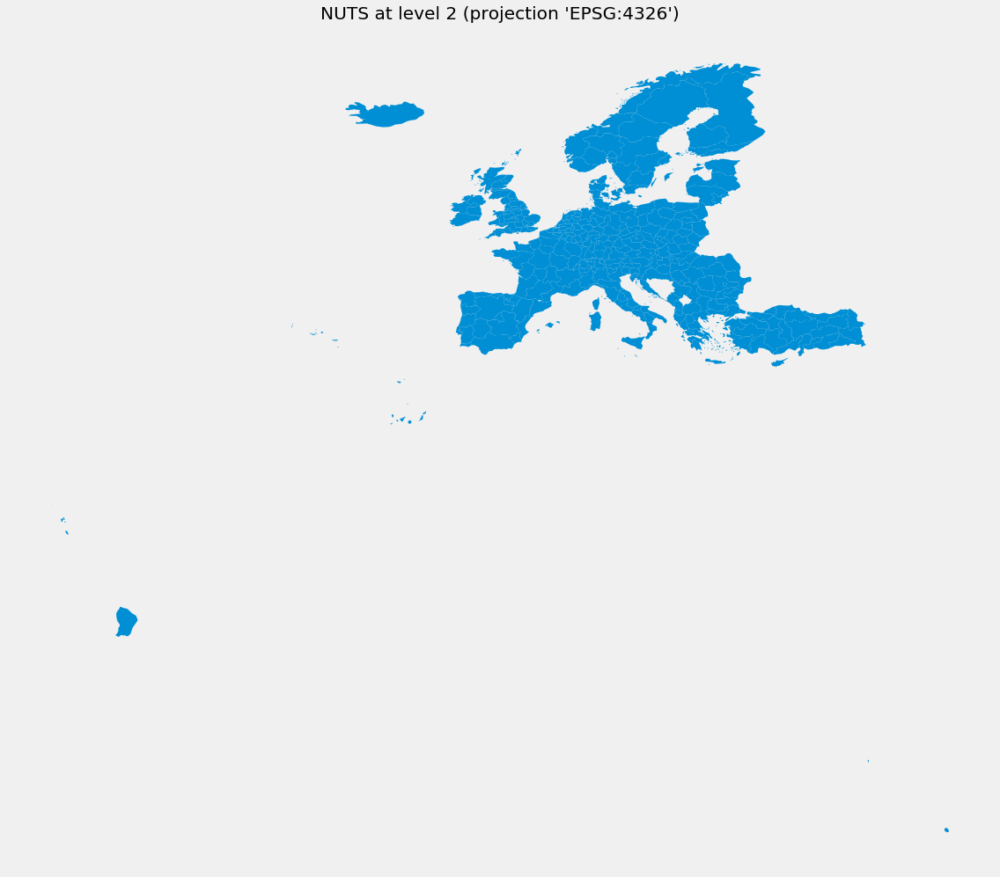

In [22]:
# Visualize the map without data

level = LEVELS[2]

f, ax = mplt.subplots(1, figsize=(16, 16))
nuts_data[level].plot(ax=ax)
ax.axes.get_xaxis().set_visible(False); ax.axes.get_yaxis().set_visible(False)
ax.set_title("NUTS at level %s (projection 'EPSG:%s')" % (level,NUTS_PROJ)) 
f.tight_layout()
mplt.show()

#### Data Exploration

We add the labor data

In [23]:
print(df.shape) #dimension
print(df2.shape)

(29051, 5)
(1352, 4)


In [24]:
# Select only member states:

pivo = pivo[pivo['NUTS_ID'].str.startswith(('AT','BE','BG','CY','CZ','DE','DK','EE','EL','ES','FI', 
                                            'FR','HR','HU','IE','IT','LT','LU','LV','MT', 'NL', 'PL',
                                            'PT', 'RO', 'SE', 'SI', 'SK'))]

In [25]:
KEY = 'NUTS_ID'

NUTS_ID = dict.fromkeys(LEVELS)
CTRY_ID = dict.fromkeys(LEVELS) 

for l in LEVELS:
    NUTS_ID.update({l: nuts_data[l][KEY].unique().tolist()})
    CTRY_ID.update({l: list(set([_id[:2] for _id in NUTS_ID[l]]))})
    
DATA_NUTS_ID = dict.fromkeys(LEVELS) 
all_id = pivo['NUTS_ID'].unique().tolist()

print('Data are availalble:') 
for l in LEVELS:
    DATA_NUTS_ID.update({l: list(set([_id[:2] for _id in all_id if len(_id)==l+2]))})
    print('* NUTS level %s: \033[1m%s\033[0m' 
          % (l, DATA_NUTS_ID[l]))

Data are availalble:
* NUTS level 0: ['LU', 'EL', 'IE', 'CZ', 'MT', 'LT', 'PT', 'SI', 'PL', 'RO', 'ES', 'FR', 'BE', 'NL', 'CY', 'AT', 'HR', 'DE', 'EE', 'HU', 'IT', 'BG', 'DK', 'LV', 'SE', 'SK', 'FI']
* NUTS level 1: ['LU', 'EL', 'IE', 'CZ', 'MT', 'LT', 'PT', 'SI', 'PL', 'RO', 'ES', 'FR', 'BE', 'NL', 'CY', 'AT', 'HR', 'DE', 'EE', 'HU', 'IT', 'BG', 'DK', 'LV', 'SE', 'SK', 'FI']
* NUTS level 2: ['LU', 'EL', 'IE', 'CZ', 'MT', 'LT', 'PT', 'SI', 'PL', 'RO', 'ES', 'FR', 'BE', 'NL', 'CY', 'AT', 'HR', 'DE', 'EE', 'HU', 'IT', 'BG', 'DK', 'LV', 'SE', 'SK', 'FI']


We can see for any given level, which country/datasets are missing:

In [26]:
MISSING_CTRY_ID = dict.fromkeys(LEVELS) 

print('Data are NOT availalble:') 
for l in LEVELS:
    MISSING_CTRY_ID.update({l: list(set(CTRY_ID[l]).difference(set(DATA_NUTS_ID[l])))})
    print('* NUTS level %s: \033[1m%s\033[0m' 
          % (l, MISSING_CTRY_ID[l]))

Data are NOT availalble:
* NUTS level 0: ['UK', 'TR', 'RS', 'MK', 'ME', 'AL', 'IS', 'NO', 'LI', 'CH']
* NUTS level 1: ['UK', 'TR', 'RS', 'MK', 'ME', 'AL', 'IS', 'NO', 'LI', 'CH']
* NUTS level 2: ['UK', 'TR', 'RS', 'MK', 'ME', 'AL', 'IS', 'NO', 'LI', 'CH']


Build table

In [27]:
pivo

year,NUTS_ID,sex,wstatus,2010,2013,2016,2019
0,AT,F,ACT,0.719394,0.737195,0.748250,0.756105
1,AT,F,EMP,0.688398,0.700441,0.708694,0.724138
2,AT,F,INAC,0.280606,0.262766,0.251787,0.243932
3,AT,F,POP,1.000000,1.000000,1.000000,1.000000
4,AT,F,UNE,0.030996,0.036793,0.039557,0.031967
5,AT,M,ACT,0.830367,0.835151,0.839958,0.849326
6,AT,M,EMP,0.790421,0.791367,0.787447,0.811722
7,AT,M,INAC,0.169633,0.164849,0.160079,0.150637
8,AT,M,POP,1.000000,1.000000,1.000000,1.000000
9,AT,M,UNE,0.039946,0.043784,0.052474,0.037604


In [28]:
def build_table(pivo, year = '2019', key='NUTS_ID', wstatus = "EMP", sex = "T", miss_id = {}):
    try:
        assert isinstance(pivo, (pd.Series,pd.DataFrame))
    except:
        raise IOError('wrong format for input dataset')
    col_drop = list(set(pivo.columns).difference(set(['NUTS_ID',year])))
    data_miss = pd.DataFrame({key: miss_id[0].copy(), year: np.nan})
    return pd.concat([(
        pivo.loc[(pivo["wstatus"]==wstatus) & (pivo["sex"]==sex)]
        .copy()
        .drop(columns=col_drop)
        #.dropna(axis='index', subset=[year])
        .rename(columns={'geo':key})
        ),
        data_miss
        ], 
        axis=0, ignore_index=True
    )

total = build_table(pivo, year = '2019', key=KEY, 
                           wstatus = 'EMP', sex = 'T', 
                           miss_id=MISSING_CTRY_ID)

total.head(-10)

year,NUTS_ID,2019
0,AT,0.767901
1,AT1,0.741333
2,AT11,0.753714
3,AT12,0.784545
4,AT13,0.703525
5,AT2,0.766985
6,AT21,0.750527
7,AT22,0.774211
8,AT3,0.800992
9,AT31,0.802630


In [29]:
#keeping = ['NUTS_ID', 'sex', 'wstatus', '2019']

#total = pivo[(pivo['sex']=='T') & (pivo['wstatus']=='EMP')]
#total = total[keeping]

#females = pivo[(pivo['sex']=='F') & (pivo['wstatus']=='EMP')]
#females = females[keeping]

#males = pivo[(pivo['sex']=='M') & (pivo['wstatus']=='EMP')]
#males = males[keeping]

In [30]:
def build_unit_level(nuts, labor, levels = [0, 1, 2], key='NUTS_ID', how='inner'): 
    try:
        assert (isinstance(nuts, dict) 
                and all([isinstance(pivo,(gpd.GeoSeries, gpd.GeoDataFrame)) for pivo in nuts.values()])
                and set(nuts.keys()).difference(set(levels)) == set())
    except:
        raise IOError('wrong format for input data dictionary')
    data = dict.fromkeys(levels)
    for l in levels:
        temp = (nuts[l]
                .merge(labor, on=key, how=how)
               )
        temp = temp[~(temp.geometry.is_empty | temp.geometry.isna())]
        temp.geometry = temp.geometry.buffer(0) # deal with invalid geometry
        data.update({l: temp})
    return data

total_data = build_unit_level(nuts_data, total, 
                                   levels = LEVELS, key = KEY, how='right') 

total_data[2].head()

,id,COAST_TYPE,MOUNT_TYPE,CNTR_CODE,FID,NUTS_ID,NUTS_NAME,LEVL_CODE,URBN_TYPE,geometry,2019
0,CY00,0.0,0.0,CY,CY00,CY00,Κύπρος,2.0,0.0,"POLYGON ((32.27382 35.06649, 32.28884 35.10503...",0.757043
1,CZ01,0.0,0.0,CZ,CZ01,CZ01,Praha,2.0,0.0,"POLYGON ((14.27179 50.09796, 14.30331 50.12882...",0.837396
2,CZ02,0.0,0.0,CZ,CZ02,CZ02,Střední Čechy,2.0,0.0,"POLYGON ((15.14677 50.52294, 15.13609 50.46398...",0.827032
3,CZ03,0.0,0.0,CZ,CZ03,CZ03,Jihozápad,2.0,0.0,"POLYGON ((13.40705 50.08962, 13.80018 49.91814...",0.806416
4,CZ04,0.0,0.0,CZ,CZ04,CZ04,Severozápad,2.0,0.0,"POLYGON ((14.48649 50.50503, 14.37508 50.39708...",0.775663


In [31]:
def propagate_unit_level(data, levels = [0, 1, 2], year = '2019', key = 'NUTS_ID', miss_id = {}):
    try:
        assert (isinstance(data, dict) 
                and all([isinstance(pivo,(gpd.GeoSeries, gpd.GeoDataFrame)) for pivo in data.values()])
                and set(data.keys()).difference(set(levels)) == set())
    except:
        raise IOError('wrong format for input data dictionary')
    nan_ctry_id = copy.deepcopy(miss_id) or dict.fromkeys(levels) 
    for l in range(len(levels)):
        level = levels[l]
        nan_ctry_id[l].extend([_id[:2] 
                               for _id in data[level].loc[data[level][year].isnull(), key].unique().tolist() 
                               if len(_id)==l+2])
        nan_ctry_id[l] = list(set(nan_ctry_id[l]))
    for ctry in nan_ctry_id[0]:
        level0 = levels[0]
        data_miss = data[level0][data[level0][key].str.startswith(ctry)].copy()
        data_miss.geometry = data_miss.geometry.buffer(0)
        for level in levels[1:]:
            data[level] = pd.concat([data[level].loc[~(data[level][key].str.startswith(ctry))], 
                                     data_miss
                                    ], 
                                    axis=0, ignore_index=True
                                   )
    for l in range(1,len(levels)):
        for ctry in nan_ctry_id[l]:
            if ctry in nan_ctry_id[l-1]:
                continue
            levelp = levels[l-1]
            data_miss = data[levelp].loc[data[levelp][key].str.startswith(ctry)].copy()
            data_miss.geometry = data_miss.geometry.buffer(0)
            for l_ in range(l,len(levels)):
                level_ = levels[l_]
                data[level_] = pd.concat([data[level_].loc[~(data[level_][key].str.startswith(ctry))], 
                                          data_miss 
                                         ], 
                                         axis=0, ignore_index=True
                                        )
    return data

total_data = propagate_unit_level(total_data, miss_id = MISSING_CTRY_ID,
                                       levels = LEVELS, year = '2019', key = KEY)
total_data[2].head()

,id,COAST_TYPE,MOUNT_TYPE,CNTR_CODE,FID,NUTS_ID,NUTS_NAME,LEVL_CODE,URBN_TYPE,geometry,2019
0,CY00,0.0,0.0,CY,CY00,CY00,Κύπρος,2.0,0.0,"POLYGON ((32.27382 35.06649, 32.28884 35.10503...",0.757043
1,CZ01,0.0,0.0,CZ,CZ01,CZ01,Praha,2.0,0.0,"POLYGON ((14.27179 50.09796, 14.30331 50.12882...",0.837396
2,CZ02,0.0,0.0,CZ,CZ02,CZ02,Střední Čechy,2.0,0.0,"POLYGON ((15.14677 50.52294, 15.13609 50.46398...",0.827032
3,CZ03,0.0,0.0,CZ,CZ03,CZ03,Jihozápad,2.0,0.0,"POLYGON ((13.40705 50.08962, 13.80018 49.91814...",0.806416
4,CZ04,0.0,0.0,CZ,CZ04,CZ04,Severozápad,2.0,0.0,"POLYGON ((14.48649 50.50503, 14.37508 50.39708...",0.775663


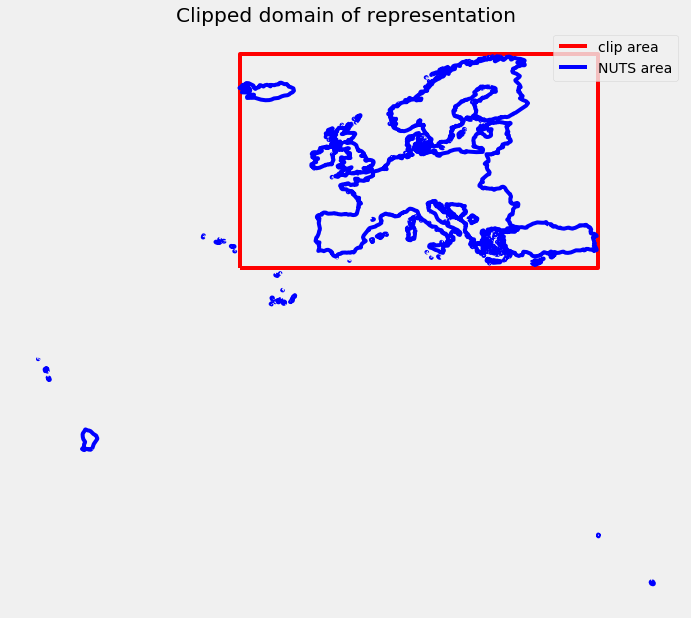

In [32]:
EUmask = geometry.Polygon([#w: -25.5, s:35, e:30.2, n:71.3 in EPSG:4326 system
                         (-24, 34),
                         (45, 34),
                         (45,  71.5),
                         (-24, 71.5)
])
EUclip = gpd.GeoDataFrame(index=[0], geometry=[EUmask], crs=PROJ)

NUTSarea = gpd.GeoDataFrame(index=[0], geometry=[nuts_data[0].unary_union], crs=PROJ)


f, ax = mplt.subplots(1, figsize=(16, 10))
EUclip.boundary.plot(ax=ax, color='r', label='clip area')
NUTSarea.boundary.plot(ax=ax, color='b', label='NUTS area')
ax.axes.get_xaxis().set_visible(False); ax.axes.get_yaxis().set_visible(False)
ax.set_title('Clipped domain of representation')
ax.legend()
mplt.show()

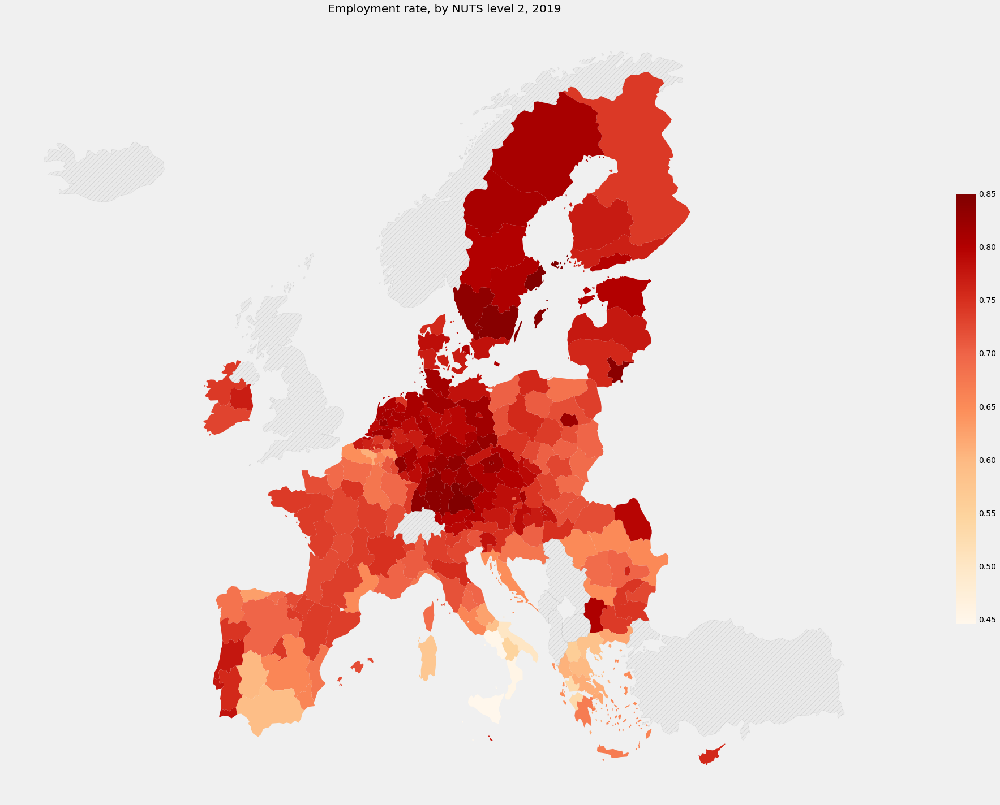

In [33]:
LEVEL = 2
YEAR = '2019'
crop = gpd.clip(total_data[LEVEL], EUclip)
# crop = nuts_death_data[LEVEL].intersection(EUclip.unary_union) 

f, ax = mplt.subplots(1, figsize=(35, 20))
crop.plot(column='2019', ax=ax, cmap='OrRd', legend=True,
          legend_kwds = {'shrink':0.55},
          missing_kwds={ "color": "lightgrey", "alpha": 0.2, "edgecolor": "grey", "hatch": "///"}
         )
ax.set_axis_off()
ax.set_title('Employment rate, by NUTS level %s, %s'
             % (LEVEL, YEAR))
f.tight_layout()
f.subplots_adjust(hspace=0,wspace=-1)
mplt.show()

### Temporal Visualization

In [34]:
YEARS

['2010', '2013', '2016', '2019']

In [35]:
DATERES, WEEKRES = None, list(range(9,18)) # select what you are interested
if WEEKRES is None:
    try:
        WEEKRES = DATERES.isocalendar()[1]
    except:
        WEEKRES = [15]
        
enumerate(WEEKRES)

In [36]:
SEX = list(['T','F','M'])
YEARS = list(['2010', '2013', '2016', '2019'])
WSTATUS = list(['EMP','UNE','INAC'])

lst=[]

for s in SEX:
    for w in WSTATUS:
        for y in YEARS:
            x = 'data_%s_%s_%s' %(s, w, y)
            lst.append(x)
            
lst

['data_T_EMP_2010',
 'data_T_EMP_2013',
 'data_T_EMP_2016',
 'data_T_EMP_2019',
 'data_T_UNE_2010',
 'data_T_UNE_2013',
 'data_T_UNE_2016',
 'data_T_UNE_2019',
 'data_T_INAC_2010',
 'data_T_INAC_2013',
 'data_T_INAC_2016',
 'data_T_INAC_2019',
 'data_F_EMP_2010',
 'data_F_EMP_2013',
 'data_F_EMP_2016',
 'data_F_EMP_2019',
 'data_F_UNE_2010',
 'data_F_UNE_2013',
 'data_F_UNE_2016',
 'data_F_UNE_2019',
 'data_F_INAC_2010',
 'data_F_INAC_2013',
 'data_F_INAC_2016',
 'data_F_INAC_2019',
 'data_M_EMP_2010',
 'data_M_EMP_2013',
 'data_M_EMP_2016',
 'data_M_EMP_2019',
 'data_M_UNE_2010',
 'data_M_UNE_2013',
 'data_M_UNE_2016',
 'data_M_UNE_2019',
 'data_M_INAC_2010',
 'data_M_INAC_2013',
 'data_M_INAC_2016',
 'data_M_INAC_2019']

In [37]:
temp_lst = list(['employment rate','unemployment ratio','inactivity rate'])
status = dict(zip(WSTATUS, temp_lst))

temp_lst = list(['RdYlGn',
                 'Spectral_r',
                 'RdYlBu_r'])
colors = dict(zip(WSTATUS, temp_lst))

temp_lst = list([0.9,
                 0.25,
                 0.6])
vmax = dict(zip(WSTATUS, temp_lst))

temp_lst = list([0.5,
                 0.05,
                 0.15])
vmin = dict(zip(WSTATUS, temp_lst))

temp_lst = list([8,
                 8,
                 6])
slices = dict(zip(WSTATUS, temp_lst))



temp_lst = list(['Total','Female','Male'])
gender = dict(zip(SEX, temp_lst))



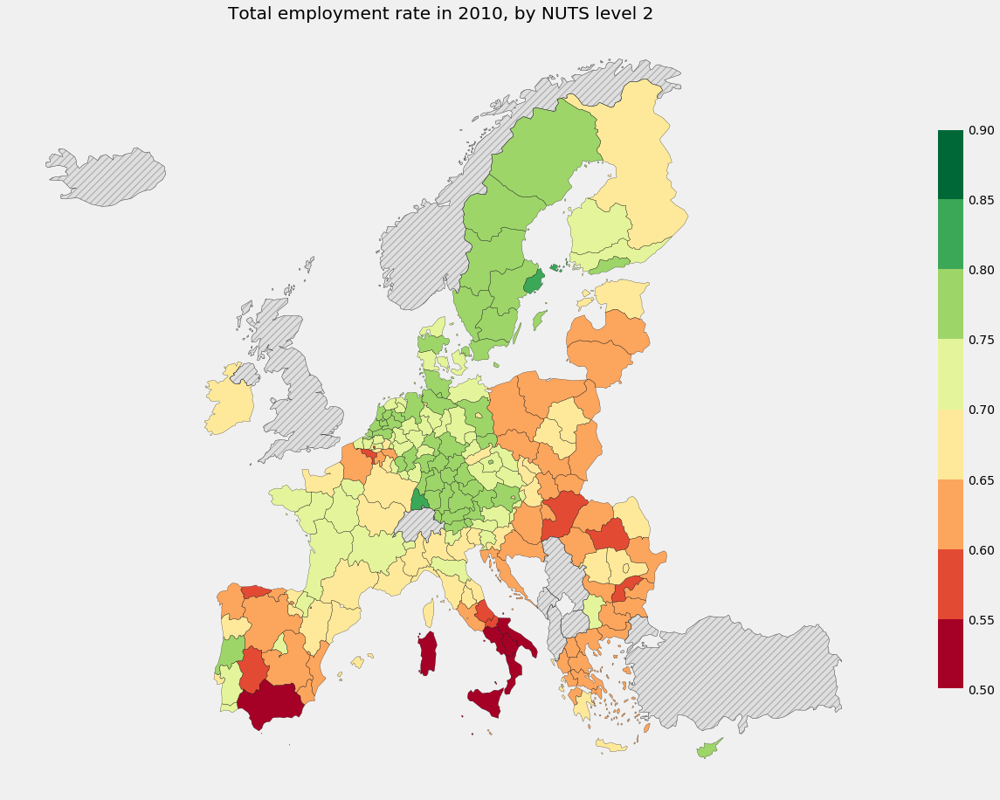

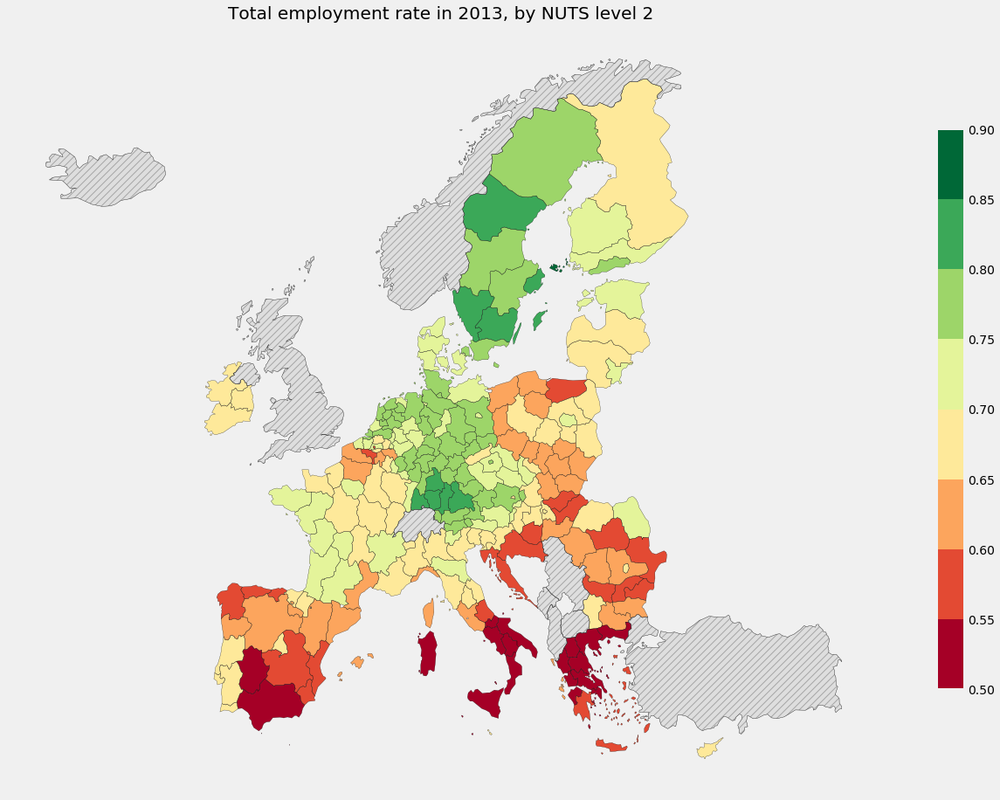

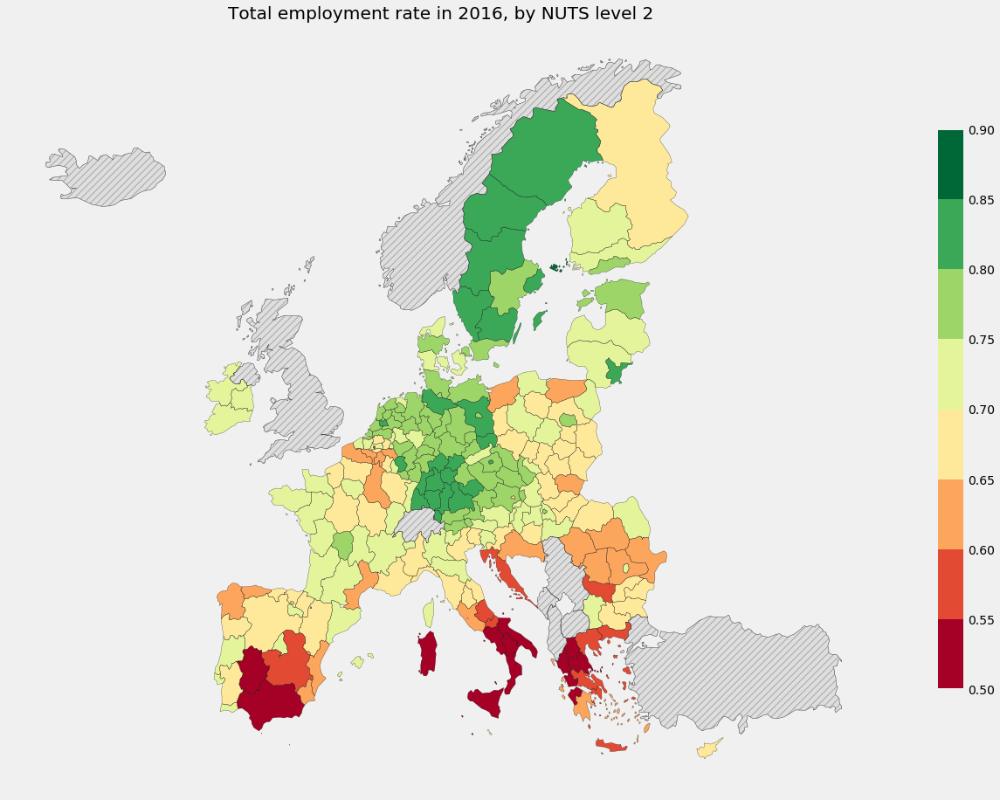

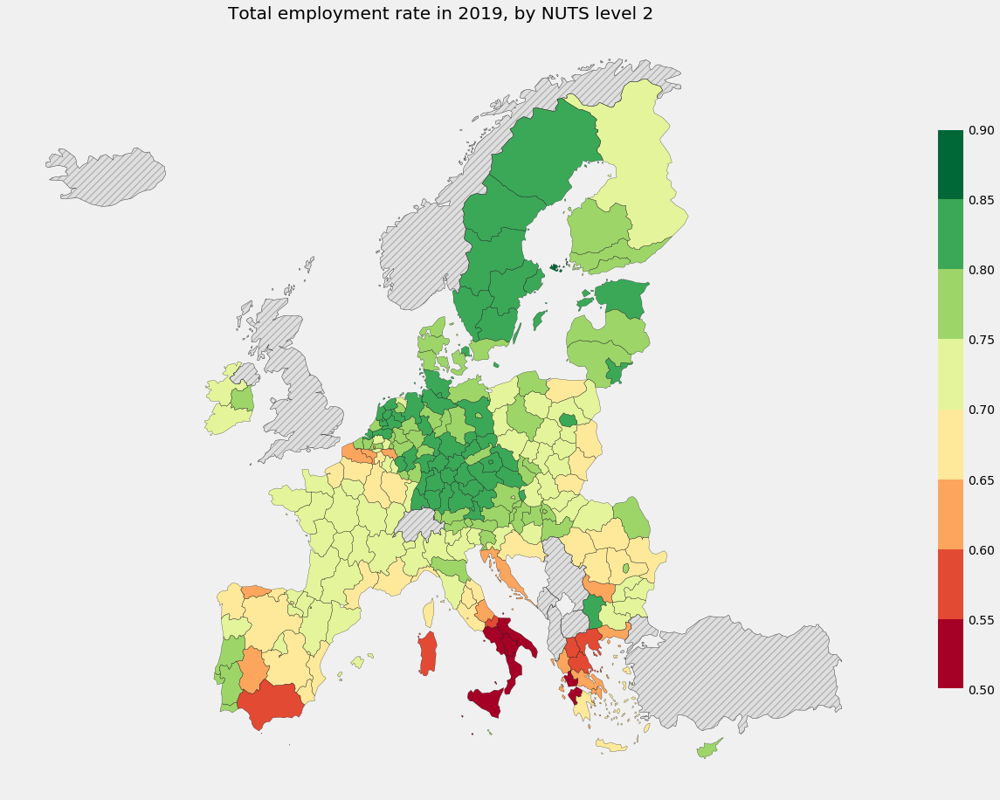

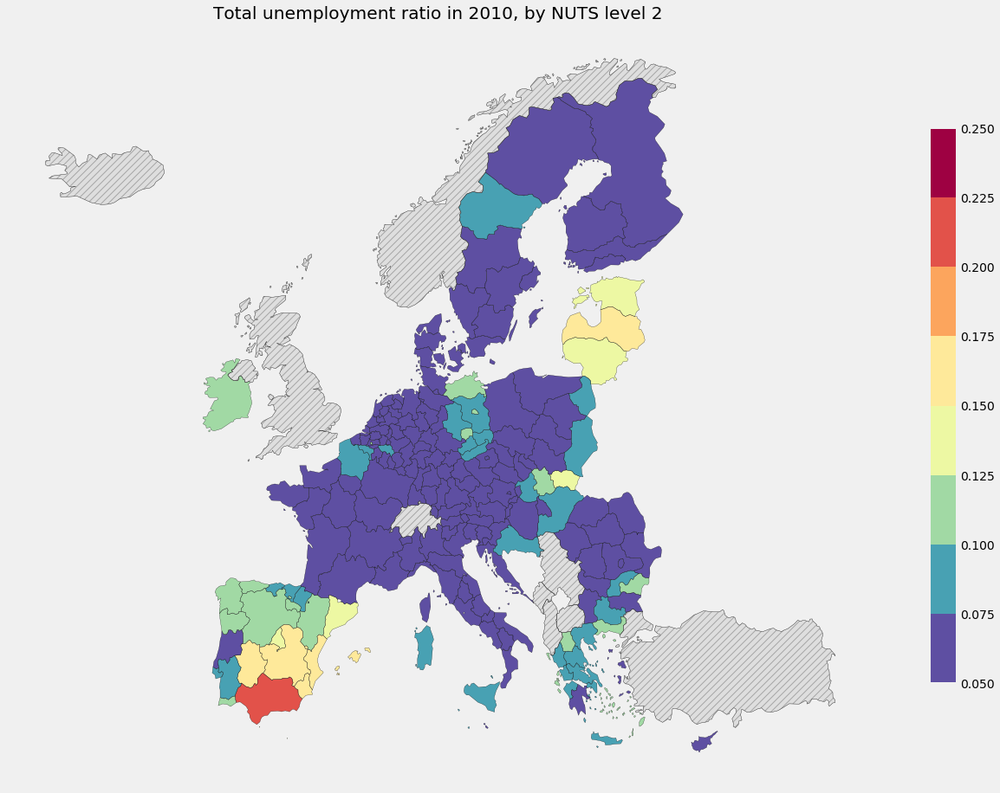

...

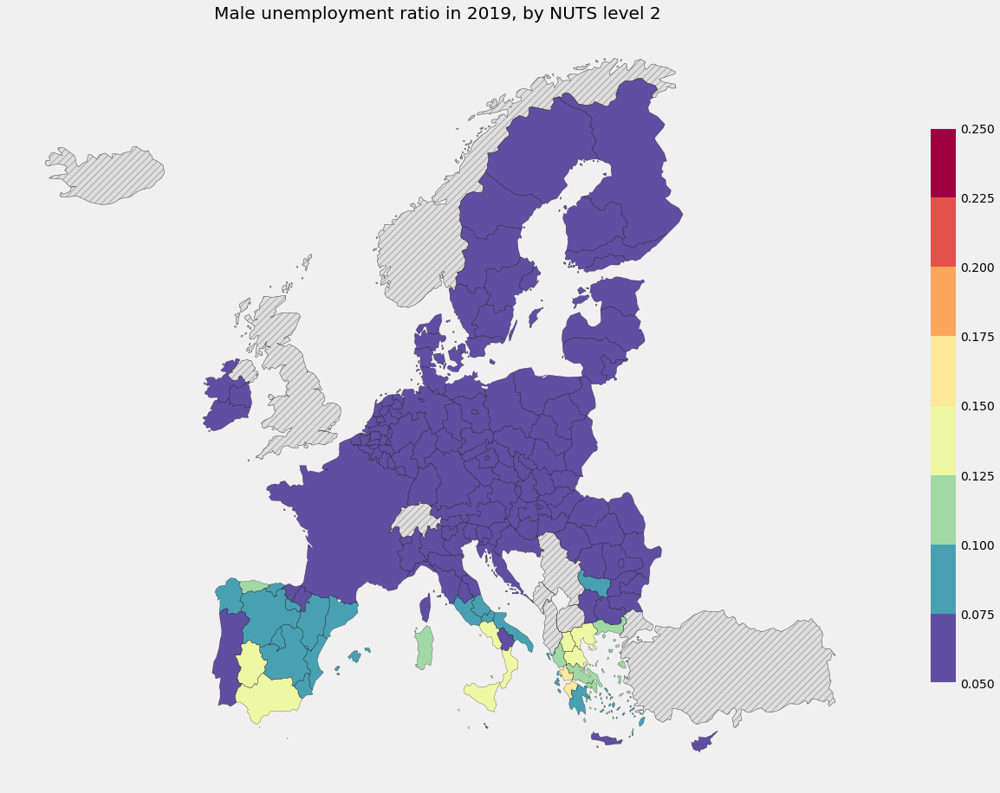

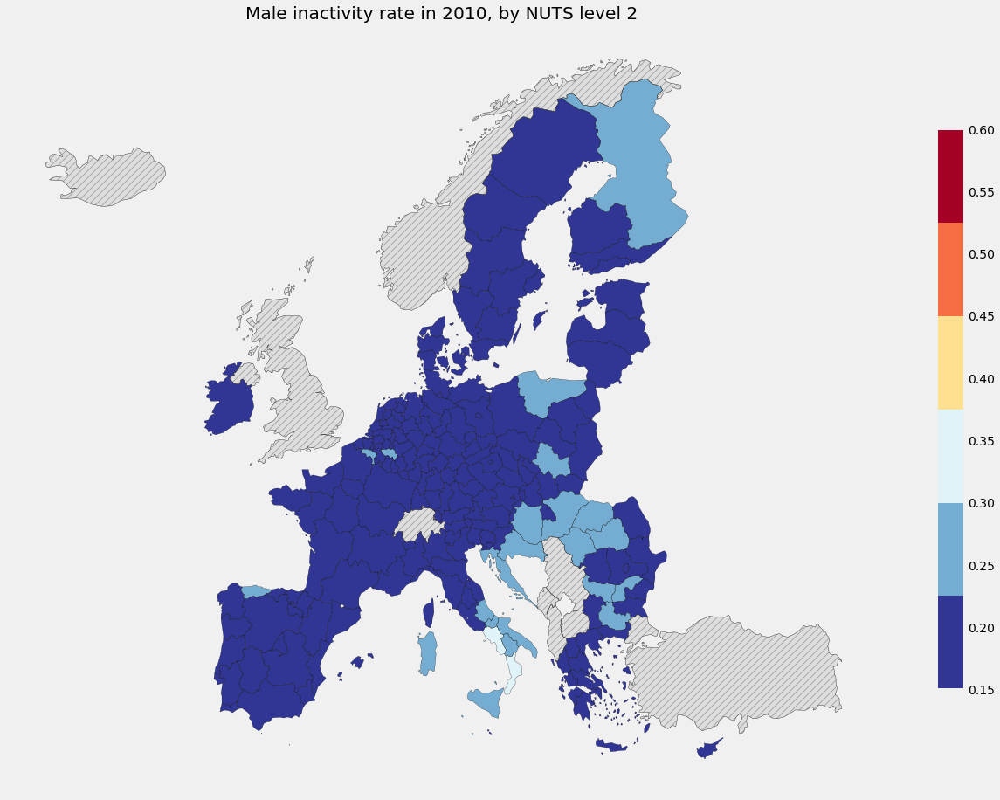

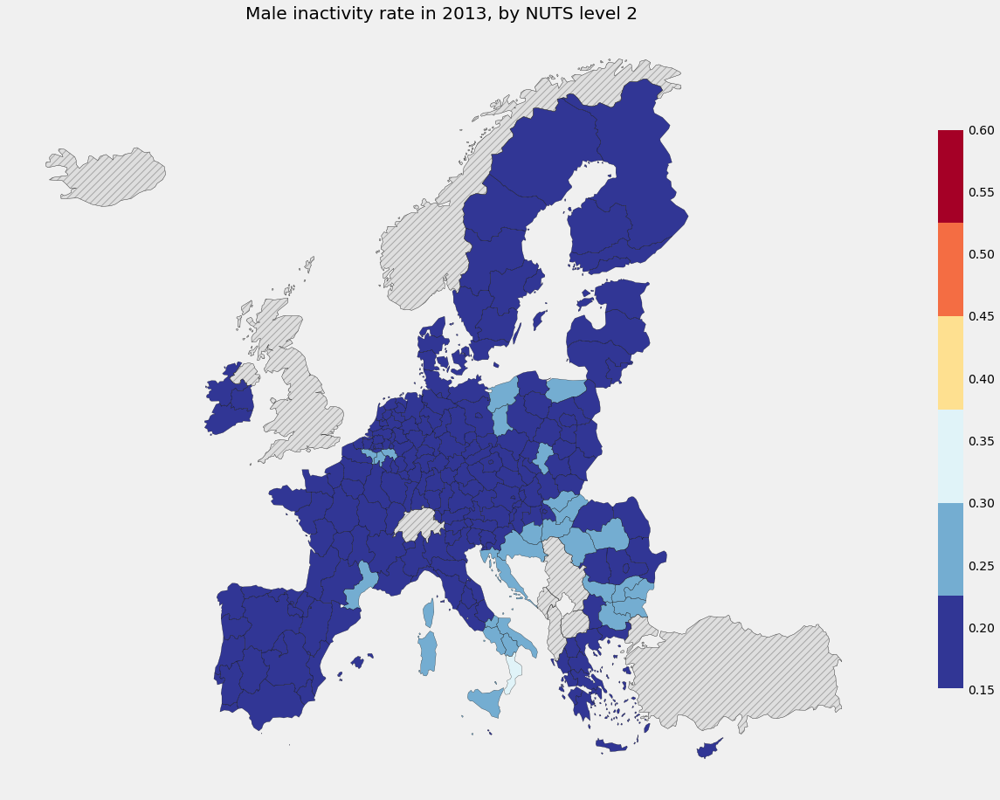

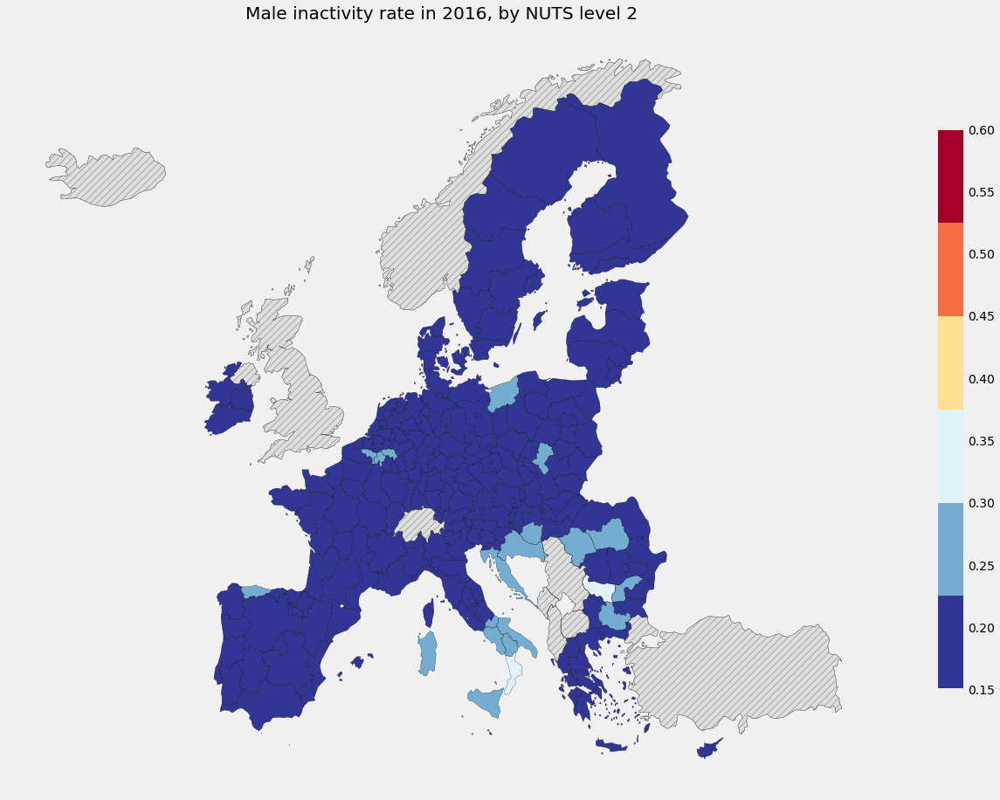

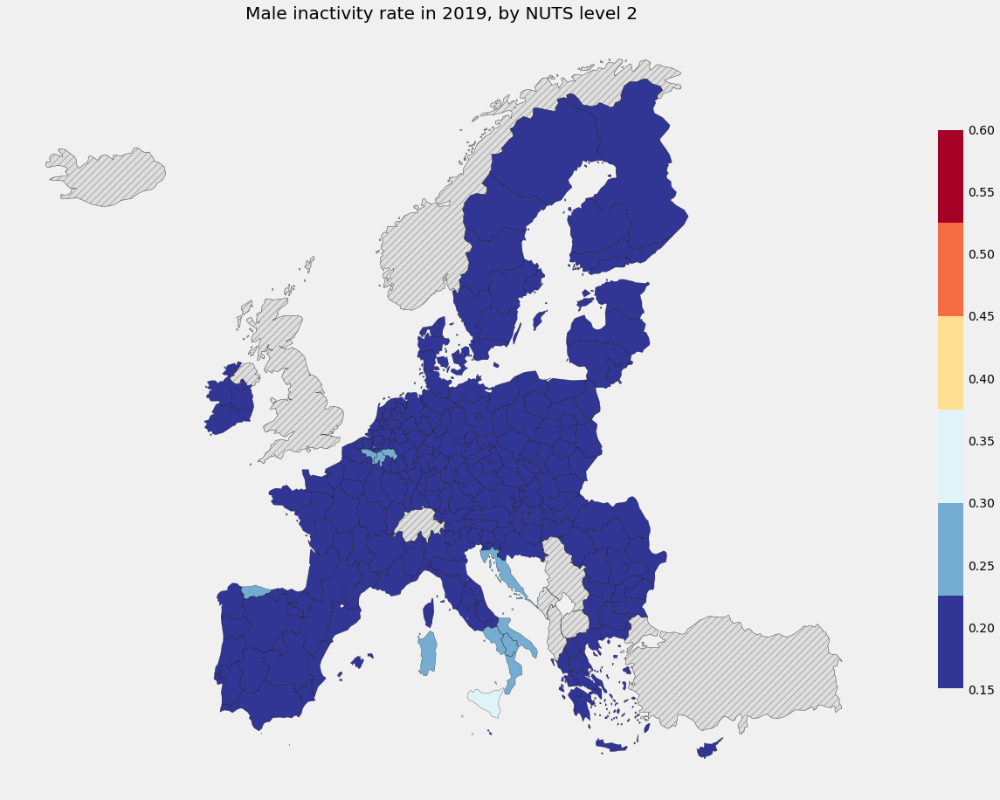

In [38]:
for s in SEX:
    for w in WSTATUS:
        for y in YEARS:
            temp = build_table(pivo, year = y, key=KEY, 
                            wstatus = w, sex = s, 
                            miss_id=MISSING_CTRY_ID)
            temp = build_unit_level(nuts_data, temp,
                            levels = LEVELS, key = KEY, how='right') 
            data = propagate_unit_level(temp, miss_id = MISSING_CTRY_ID,
                            levels = LEVELS, year = y, key = KEY)
            
            crop = gpd.clip(data[LEVEL], EUclip)
            # crop = nuts_death_data[LEVEL].intersection(EUclip.unary_union) 
            
            f, ax = mplt.subplots(1, figsize=(20, 20))
            crop.plot(column=y, ax=ax, cmap=mpl.cm.get_cmap(colors[w], slices[w]), legend=True, vmax=vmax[w], vmin=vmin[w],
                      legend_kwds = {'shrink':0.55},
                      missing_kwds={ "color": "lightgrey", "alpha": 0.6, "edgecolor": "grey", "hatch": "///"}
                     )
            crop.boundary.plot(ax = ax, color = 'black', linewidth=0.25)
            ax.set_axis_off()
            ax.set_title('%s %s in %s, by NUTS level %s '
                         % (gender[s], status[w], y, LEVEL))
            #f.tight_layout()
            #f.subplots_adjust(hspace=0,wspace=-1)
            mplt.show()
            
# I need to change the name of the map via dictionary

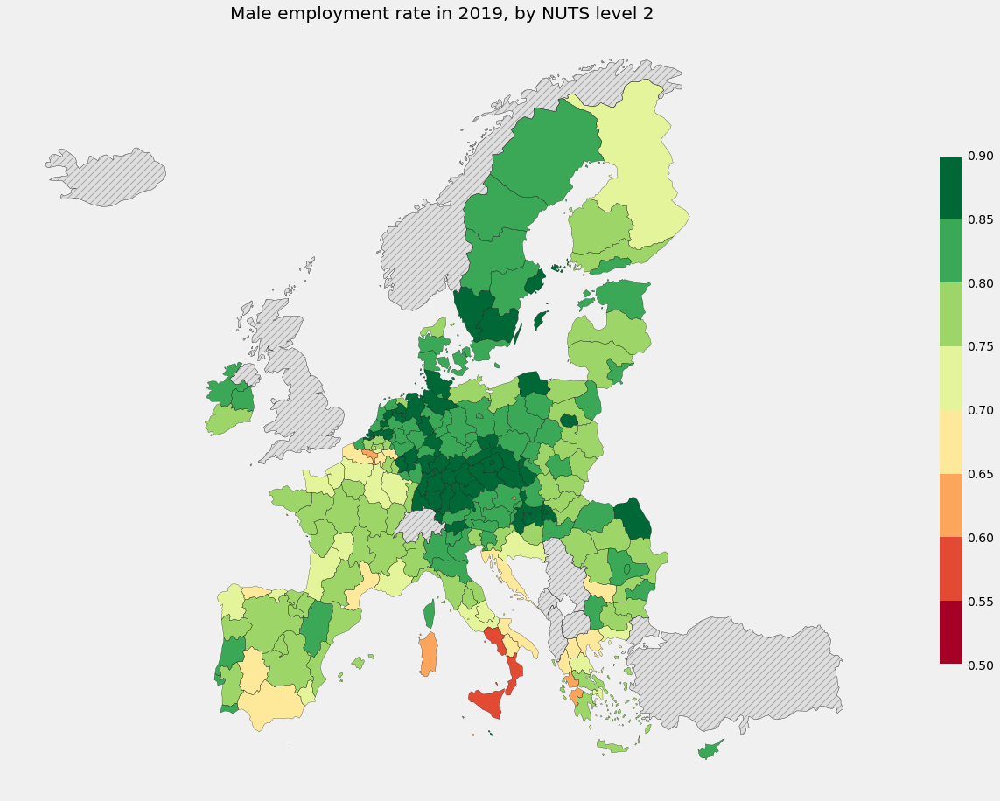

In [39]:
s = SEX[2]
w = WSTATUS[0]
y = YEARS[3]
LEVEL = 2

temp = build_table(pivo, year = y, key=KEY, 
                            wstatus = w, sex = s, 
                            miss_id=MISSING_CTRY_ID)
temp = build_unit_level(nuts_data, temp,
                            levels = LEVELS, key = KEY, how='right') 
data = propagate_unit_level(temp, miss_id = MISSING_CTRY_ID,
                            levels = LEVELS, year = y, key = KEY)


crop = gpd.clip(data[LEVEL], EUclip)
# crop = nuts_death_data[LEVEL].intersection(EUclip.unary_union) 

fig, ax = mplt.subplots(1, figsize=(20, 20))
crop.plot(column=y, ax=ax, cmap=mpl.cm.get_cmap(colors[w], slices[w]), legend=True, vmax=vmax[w], vmin=vmin[w],
          legend_kwds = {'shrink':0.5},
          missing_kwds= { "color": "lightgrey", "alpha": 0.6, "edgecolor": "grey", "hatch": "///"}
         )
crop.boundary.plot(ax = ax, color = 'black', linewidth=0.25)
ax.set_axis_off()
ax.set_title('%s %s in %s, by NUTS level %s '
             % (gender[s], status[w], y, LEVEL))
#fig.tight_layout()
#fig.subplots_adjust(hspace=0,wspace=-1)


mplt.show()

## Getting into the numbers

In [102]:
pivo = pivo[(pivo.wstatus=='EMP') | (pivo.wstatus=='UNE') |(pivo.wstatus=='INAC')]

In [118]:
#Italian Case
eu27 = pivo[pivo['NUTS_ID']=='EU27_2020']

pivoit = pivo[pivo['NUTS_ID'].str.startswith('IT')]
mask = (pivoit['NUTS_ID'].str.len() == 4)
pivoit2 = pivoit.loc[mask]

italy = pivo[pivo['NUTS_ID']=='IT']


compare=italy.append(eu27)
#compare
print(compare.groupby(['wstatus','sex','NUTS_ID']).mean())



year                       2010      2013      2016      2019
wstatus sex NUTS_ID                                          
EMP     F   EU27_2020  0.611855  0.615392  0.642654  0.672097
            IT         0.495001  0.499045  0.515941  0.538316
        M   EU27_2020  0.744270  0.733301  0.759228  0.789114
            IT         0.726982  0.697261  0.716819  0.733576
        T   EU27_2020  0.677721  0.674048  0.700757  0.730472
            IT         0.609857  0.597200  0.615592  0.635364
INAC    F   EU27_2020  0.321763  0.305670  0.291753  0.277793
            IT         0.454274  0.428138  0.409797  0.395268
        M   EU27_2020  0.177319  0.175069  0.167901  0.157819
            IT         0.216428  0.214167  0.196667  0.193924
        T   EU27_2020  0.249914  0.240700  0.230023  0.217943
            IT         0.336511  0.322181  0.304071  0.295190
UNE     F   EU27_2020  0.066382  0.078938  0.065592  0.050111
            IT         0.050731  0.072823  0.074262  0.066422
        

year,NUTS_ID,sex,wstatus,2010,2013,2016,2019
3740,IT,F,EMP,0.495001,0.499045,0.515941,0.538316
3741,IT,F,INAC,0.454274,0.428138,0.409797,0.395268
3743,IT,F,UNE,0.050731,0.072823,0.074262,0.066422
3745,IT,M,EMP,0.726982,0.697261,0.716819,0.733576
3746,IT,M,INAC,0.216428,0.214167,0.196667,0.193924
3748,IT,M,UNE,0.056590,0.088566,0.086514,0.072505
3750,IT,T,EMP,0.609857,0.597200,0.615592,0.635364
3751,IT,T,INAC,0.336511,0.322181,0.304071,0.295190
3753,IT,T,UNE,0.053632,0.080619,0.080340,0.069442
3755,ITC,F,EMP,0.593370,0.603852,0.618359,0.639676


In [154]:
dic_regions={
    'ITC1':'Piemonte',
    'ITC2':"Valle d'Aosta",
    'ITC3':'Liguria',
    'ITC4':'Lombardia',
    'ITF1':'Abruzzo',
    'ITF2':'Molise',
    'ITF3':'Campania',
    'ITF4':'Puglia',
    'ITF5':'Basilicata',
    'ITF6':'Calabria',
    'ITG1':'Sicilia',
    'ITG2':'Sardegna',
    'ITH1':'Prov. Autonoma di Bolzano',
    'ITH2':'Prov. Autonoma di Trento',
    'ITH3':'Veneto',
    'ITH4':'Friuli-Venezia Giulia',
    'ITH5':'Emilia-Romagna',
    'ITI1':'Toscana',
    'ITI2':'Umbria',
    'ITI3':'Marche',
    'ITI4':'Lazio'
}

pivoit2['Name'] = pivoit2['NUTS_ID'].map(dic_regions)

total_emp = pivoit2[(pivoit2['sex']=='T')&(pivoit2['wstatus']=='EMP')].set_index('Name')
female_emp = pivoit2[(pivoit2['sex']=='F')&(pivoit2['wstatus']=='EMP')].set_index('Name')
male_emp = pivoit2[(pivoit2['sex']=='M')&(pivoit2['wstatus']=='EMP')].set_index('Name')

total_une = pivoit2[(pivoit2['sex']=='T')&(pivoit2['wstatus']=='UNE')].set_index('Name')
female_une = pivoit2[(pivoit2['sex']=='F')&(pivoit2['wstatus']=='UNE')].set_index('Name')
male_une = pivoit2[(pivoit2['sex']=='M')&(pivoit2['wstatus']=='UNE')].set_index('Name')

total_ina = pivoit2[(pivoit2['sex']=='T')&(pivoit2['wstatus']=='INAC')].set_index('Name')
female_ina = pivoit2[(pivoit2['sex']=='F')&(pivoit2['wstatus']=='INAC')].set_index('Name')
male_ina = pivoit2[(pivoit2['sex']=='M')&(pivoit2['wstatus']=='INAC')].set_index('Name')

variables = ['wstatus','sex','2010','2013','2016','2019']
order = ['2019','2016','2013','2010'] #Sort by 2019 first

print(total_emp[variables].sort_values(by=order, ascending=True))
print(total_ina[variables].sort_values(by=order, ascending=False))
print(total_une[variables].sort_values(by=order, ascending=False))

print(female_emp[variables].sort_values(by=order, ascending=True))
print(female_ina[variables].sort_values(by=order, ascending=False))
print(female_une[variables].sort_values(by=order, ascending=False))

print(male_emp[variables].sort_values(by=order, ascending=True))
print(male_ina[variables].sort_values(by=order, ascending=False))
print(male_une[variables].sort_values(by=order, ascending=False))





year                      wstatus sex      2010      2013      2016      2019
Name                                                                         
Sicilia                       EMP   T  0.466585  0.428007  0.434989  0.445448
Campania                      EMP   T  0.436067  0.433741  0.448980  0.451722
Calabria                      EMP   T  0.460492  0.423122  0.428643  0.453459
Puglia                        EMP   T  0.480917  0.459487  0.480482  0.501966
Basilicata                    EMP   T  0.512507  0.499574  0.543303  0.547917
Sardegna                      EMP   T  0.545706  0.516445  0.536113  0.573492
Molise                        EMP   T  0.551742  0.512414  0.557289  0.585611
Abruzzo                       EMP   T  0.596156  0.590462  0.597495  0.625129
Lazio                         EMP   T  0.634136  0.619616  0.642303  0.656864
Liguria                       EMP   T  0.667398  0.646779  0.670982  0.676831
Umbria                        EMP   T  0.669539  0.651003  0.672

In [ ]:
#total = pivo[(pivo['sex']=='T')]
#females = pivo[(pivo['sex']=='F')]
#males = pivo[(pivo['sex']=='M')]

In [40]:
%lsmagic

Available line magics:
%alias  %alias_magic  %autoawait  %autocall  %automagic  %autosave  %bookmark  %cat  %cd  %clear  %colors  %conda  %config  %connect_info  %cp  %debug  %dhist  %dirs  %doctest_mode  %ed  %edit  %env  %gui  %hist  %history  %killbgscripts  %ldir  %less  %lf  %lk  %ll  %load  %load_ext  %loadpy  %logoff  %logon  %logstart  %logstate  %logstop  %ls  %lsmagic  %lx  %macro  %magic  %man  %matplotlib  %mkdir  %more  %mv  %notebook  %page  %pastebin  %pdb  %pdef  %pdoc  %pfile  %pinfo  %pinfo2  %pip  %popd  %pprint  %precision  %prun  %psearch  %psource  %pushd  %pwd  %pycat  %pylab  %qtconsole  %quickref  %recall  %rehashx  %reload_ext  %rep  %rerun  %reset  %reset_selective  %rm  %rmdir  %run  %save  %sc  %set_env  %store  %sx  %system  %tb  %time  %timeit  %unalias  %unload_ext  %who  %who_ls  %whos  %xdel  %xmode

Available cell magics:
%%!  %%HTML  %%SVG  %%bash  %%capture  %%debug  %%file  %%html  %%javascript  %%js  %%latex  %%markdown  %%perl  %%prun  %%pypy  %%